In [46]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

This code is a sample test and evaluation of wgan, for learning.  we use wgan-gp to generate anime face. we will use kera library.
We use kaggle dataset called [animface](https://www.kaggle.com/datasets/splcher/animefacedataset)

In [47]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [48]:
#!kaggle datasets download -d splcher/animefacedataset -p datasets

In [49]:
#!unzip datasets/animefacedataset.zip -d datasets/

In [50]:
data_dir = "/kaggle/working/datasets/images"
train_img = tf.keras.utils.image_dataset_from_directory(
    data_dir, label_mode=None, image_size=(64, 64), batch_size=256 # Margaret: increase batch size from 32 
)

Found 63565 files.


# **Visualization**
let us visualize some image

Visualization
It is always important to visualize image before precessing.

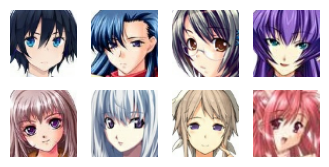

In [51]:
image_batch = next(iter(train_img))
# Visualize 8 images from the training dataset
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(8):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i]) 
        plt.imshow(img)
        plt.axis('off') 
    plt.show()
show(image_batch[:8])

In [52]:
# latent dimension of the random noise
LATENT_DIM = 128
# weight initializer for G per DCGAN paper 
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3 

In [53]:
def build_generator():
    # create a Keras Sequential model 
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4), 
                                     strides=(2, 2),
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) 
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4), 
                                     strides=(2, 2),
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) 
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4), 
                                     strides=(2, 2),
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) 
    model.add((layers.ReLU()))

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [54]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_img = train_img.map(lambda x: (x - 127.5) / 127.5)

In [55]:
# build the generator model
generator = build_generator() 
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 32768)          │     4,227,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_8 (ReLU)                  │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_2 (Reshape)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_6              │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_9 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_7              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_10 (ReLU)                 │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_8              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_11 (ReLU)                 │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 64, 64, 3)      │         3,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,984,451 (26.64 MB)

 Trainable params: 6,983,555 (26.64 MB)

 Non-trainable params: 896 (3.50 KB)

In [56]:
def build_critic(height, width, depth, alpha=0.2):
    # Weight clipping to [-1, 1] to enfoce 1-Lipschitz constraint
    # constraint = WeightClip(0.01) # UPDATE for WGAN-GP: remove weight clipping

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), 
                            padding="same", 
                            strides=(2, 2), 
                            # kernel_constraint = constraint, # UPDATE for WGAN-GP: remove weight clipping
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), 
                            padding="same", 
                            strides=(2, 2))) 
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), 
                            padding="same", 
                            strides=(2, 2))) 
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3)) 

    # linear activation in the last layer 
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [57]:
# build the critic model
critic = build_critic(64, 64, 3)
critic.summary()

Model: "critic"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 32, 32, 64)     │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 8, 8, 128)      │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 404,801 (1.54 MB)

 Trainable params: 404,801 (1.54 MB)

 Non-trainable params: 0 (0.00 B)

# WGAN-GP
implement wgan-gp and override train_step() to implement custom training steps for training the critic and generator in wgan-gp.

In [58]:
class WGAN_GP(keras.Model):
    def __init__(self, 
                 critic, 
                 generator, 
                 latent_dim, 
                 critic_extra_steps, 
                 gp_weight=10.0): # UPDATE for WGAN-GP: gradient penalty weight
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.gp_weight = gp_weight # WGAN-GP
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")


    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN_GP, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN-GP: use gradient penalty instead of weight clipping
    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        Gradient penalty is calculated on an interpolated image
        and added to the discriminator loss.
        """
        
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        # 1. Create the interpolated image
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 2. Get the Critic's output for the interpolated image
            pred = self.critic(interpolated, training=True)

        # 3. Calculate the gradients w.r.t to the interpolated image
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 4. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        # 5. Calculate gradient penalty
        gradient_penalty = tf.reduce_mean((norm - 1.0) ** 2)
        return gradient_penalty

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Train the critic more often than the generator by 5 times (self.c_extra_steps) 
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images
            with tf.GradientTape() as tape:
                pred_real = self.critic(real_images, training=True)
                fake_images = self.generator(noise, training=True) 
                pred_fake = self.critic(fake_images, training=True)
                # UPDATE for WGAN-GP: Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # UPDATE for WGAN-GP: Add gradient penalty to the original critic loss 
                d_loss = self.d_loss_fn(pred_real, pred_fake) + gp * self.gp_weight 
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

# Use Keras Callback to monitor training


In [59]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch)) 
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [60]:
wgan_gp = WGAN_GP(critic=critic, 
              generator=generator, 
              latent_dim=LATENT_DIM,
              critic_extra_steps=5) 

In [61]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [62]:
#compil
LR = 0.0002 # WGAN-GP paper recommends lr of 0.0002
d_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0.5, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp
g_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0.5, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp

In [63]:
wgan_gp.compile(
    d_optimizer=d_optimizer,
    g_optimizer=g_optimizer,  
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

Epoch 1/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 612ms/step - d_loss: -49.2727 - g_loss: 42.2913

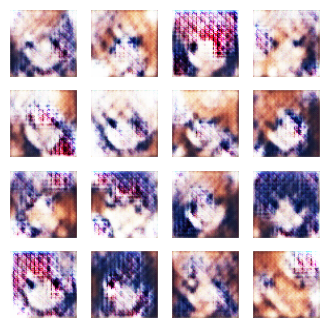

249/249 ━━━━━━━━━━━━━━━━━━━━ 199s 615ms/step - d_loss: -49.1960 - g_loss: 42.2305
Epoch 2/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -15.0378 - g_loss: -11.5633

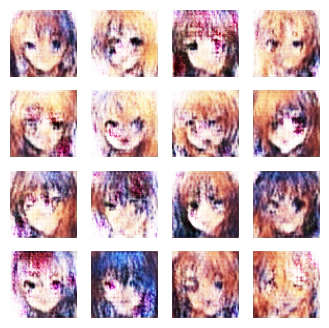

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -15.0316 - g_loss: -11.6281
Epoch 3/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -9.7410 - g_loss: -54.3607

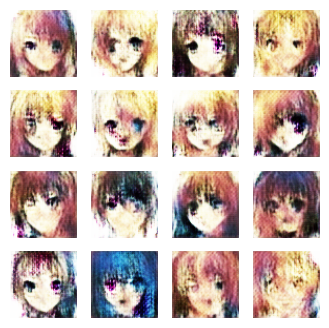

249/249 ━━━━━━━━━━━━━━━━━━━━ 118s 472ms/step - d_loss: -9.7388 - g_loss: -54.3523
Epoch 4/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -7.4463 - g_loss: -62.5310

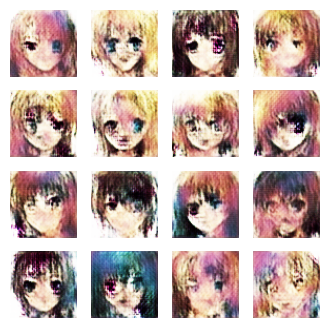

249/249 ━━━━━━━━━━━━━━━━━━━━ 141s 470ms/step - d_loss: -7.4460 - g_loss: -62.5500
Epoch 5/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -6.8066 - g_loss: -66.0534

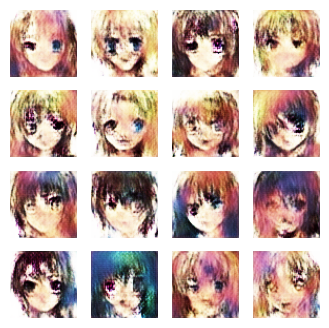

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -6.8063 - g_loss: -66.0382
Epoch 6/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -6.3467 - g_loss: -60.3157

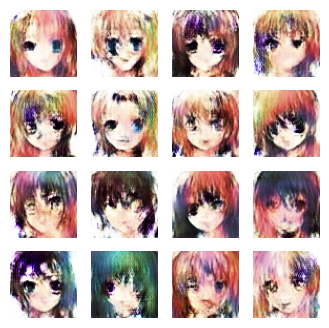

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -6.3461 - g_loss: -60.3056
Epoch 7/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -5.7379 - g_loss: -47.8590

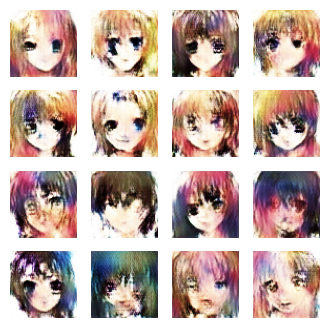

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -5.7379 - g_loss: -47.8274
Epoch 8/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -5.3331 - g_loss: -19.8255

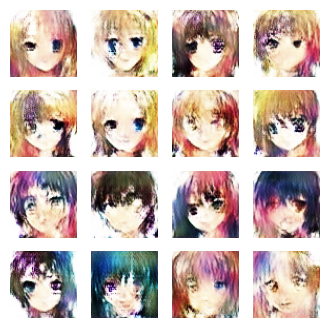

249/249 ━━━━━━━━━━━━━━━━━━━━ 142s 470ms/step - d_loss: -5.3329 - g_loss: -19.8007
Epoch 9/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -5.1682 - g_loss: -13.9801

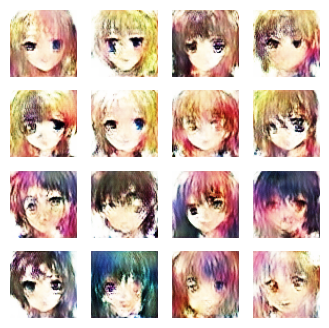

249/249 ━━━━━━━━━━━━━━━━━━━━ 118s 472ms/step - d_loss: -5.1688 - g_loss: -13.9789
Epoch 10/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -5.4309 - g_loss: -21.8411

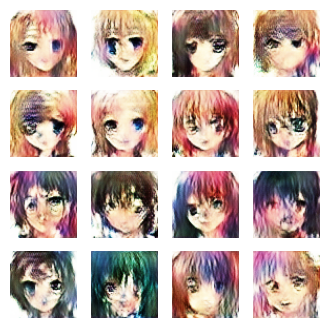

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -5.4301 - g_loss: -21.8177
Epoch 11/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -4.9423 - g_loss: -1.3897

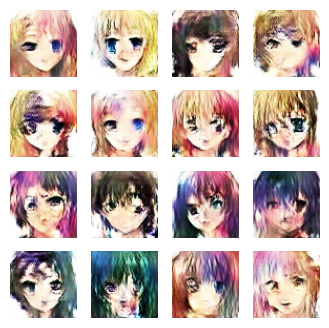

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -4.9422 - g_loss: -1.3930
Epoch 12/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -4.7270 - g_loss: 3.6096

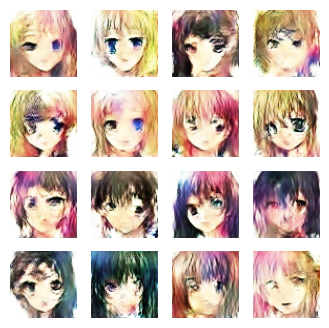

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -4.7264 - g_loss: 3.6084
Epoch 13/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -4.2438 - g_loss: 5.4245

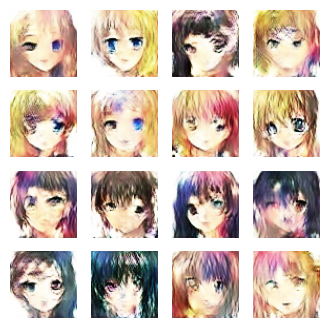

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -4.2436 - g_loss: 5.3990
Epoch 14/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.8520 - g_loss: 27.8816

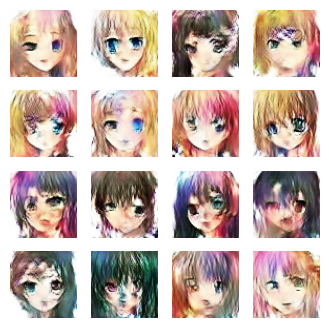

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.8529 - g_loss: 27.8696
Epoch 15/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.9655 - g_loss: 6.5441

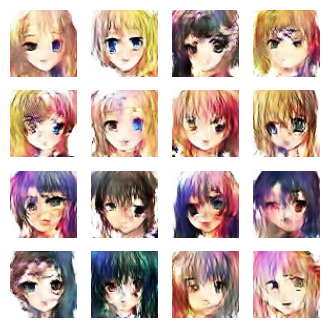

249/249 ━━━━━━━━━━━━━━━━━━━━ 118s 472ms/step - d_loss: -3.9656 - g_loss: 6.4908
Epoch 16/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.7880 - g_loss: 6.3147

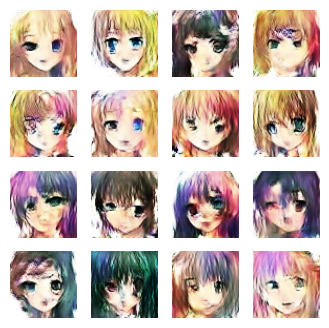

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.7885 - g_loss: 6.3384
Epoch 17/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -4.0185 - g_loss: -23.1501

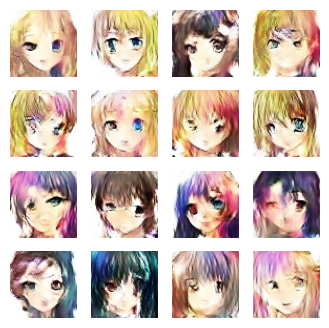

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -4.0190 - g_loss: -23.1472
Epoch 18/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -4.6668 - g_loss: -13.8814

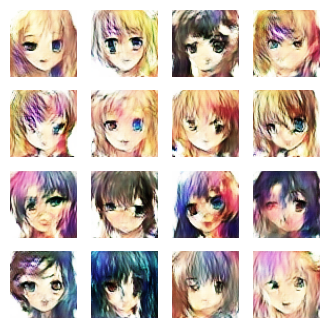

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -4.6667 - g_loss: -13.8238
Epoch 19/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -4.1918 - g_loss: 19.2269

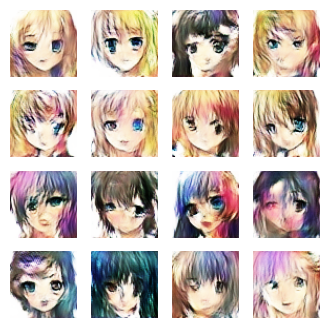

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -4.1915 - g_loss: 19.1627
Epoch 20/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.5452 - g_loss: -16.2406

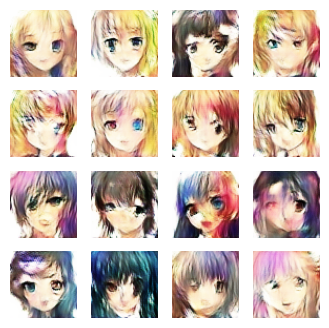

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.5460 - g_loss: -16.2257
Epoch 21/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.8390 - g_loss: -2.8824

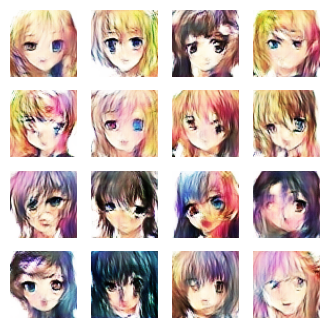

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.8387 - g_loss: -2.8460
Epoch 22/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.5029 - g_loss: 0.4914

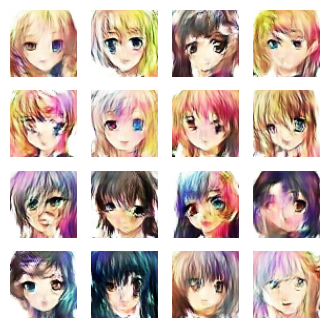

249/249 ━━━━━━━━━━━━━━━━━━━━ 118s 472ms/step - d_loss: -3.5030 - g_loss: 0.5161
Epoch 23/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.5292 - g_loss: 18.9760

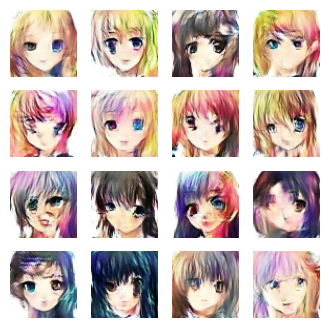

249/249 ━━━━━━━━━━━━━━━━━━━━ 141s 470ms/step - d_loss: -3.5292 - g_loss: 18.9383
Epoch 24/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.3100 - g_loss: 9.9633 

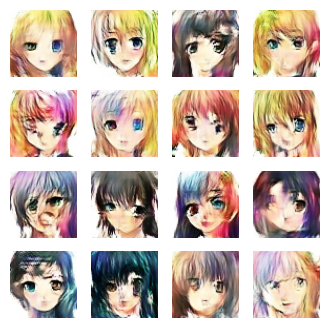

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.3103 - g_loss: 9.8906
Epoch 25/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.1020 - g_loss: -12.4465

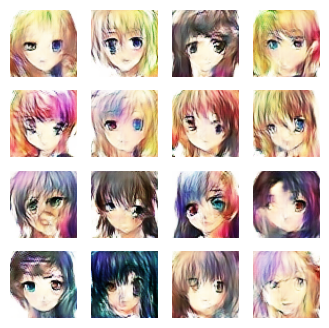

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.1026 - g_loss: -12.3578
Epoch 26/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.4480 - g_loss: 25.7801

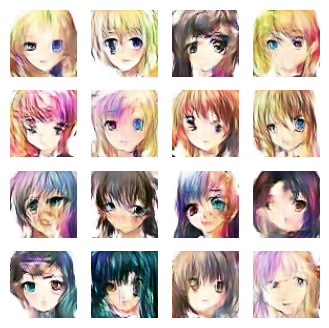

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.4471 - g_loss: 25.7414
Epoch 27/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.1798 - g_loss: 24.4932

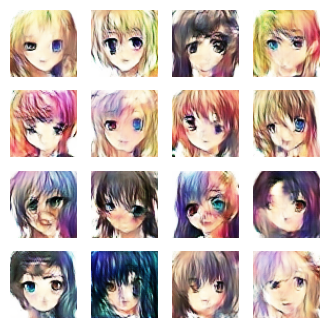

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.1796 - g_loss: 24.4655
Epoch 28/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -3.3445 - g_loss: -5.2714

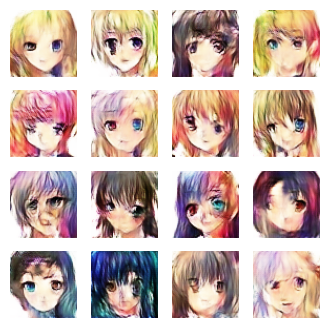

249/249 ━━━━━━━━━━━━━━━━━━━━ 118s 472ms/step - d_loss: -3.3442 - g_loss: -5.2232
Epoch 29/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -2.7709 - g_loss: -30.2150

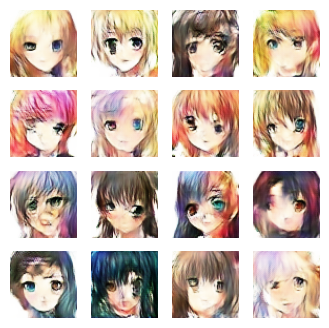

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.7712 - g_loss: -30.2065
Epoch 30/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -3.0087 - g_loss: -34.1023

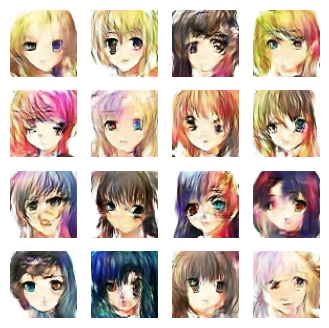

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -3.0085 - g_loss: -34.0726
Epoch 31/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.7979 - g_loss: 23.9767

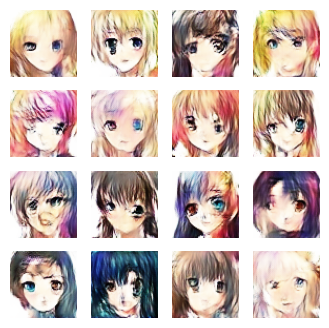

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.7980 - g_loss: 24.0365
Epoch 32/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -2.6545 - g_loss: 56.6567

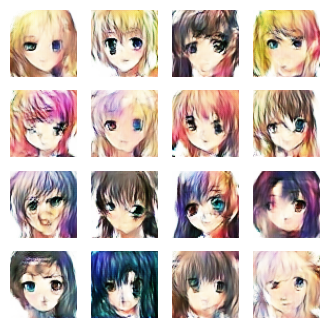

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.6546 - g_loss: 56.6210
Epoch 33/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.9182 - g_loss: 15.5031

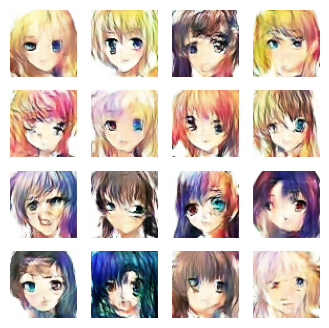

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.9174 - g_loss: 15.4583
Epoch 34/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -2.6169 - g_loss: -0.5160

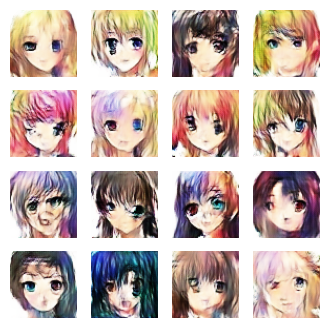

249/249 ━━━━━━━━━━━━━━━━━━━━ 118s 472ms/step - d_loss: -2.6171 - g_loss: -0.5749
Epoch 35/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.5185 - g_loss: -15.4610

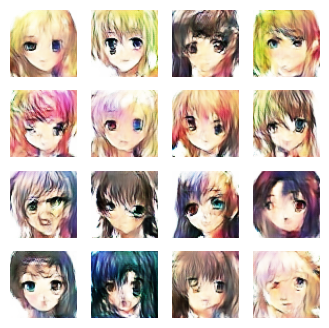

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.5188 - g_loss: -15.4927
Epoch 36/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -2.9064 - g_loss: 7.0357

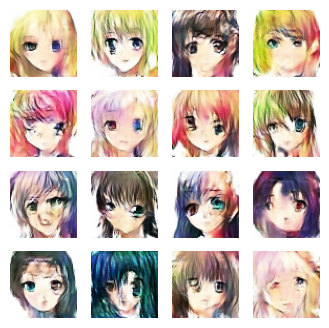

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.9064 - g_loss: 7.1805
Epoch 37/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.6229 - g_loss: 97.3524

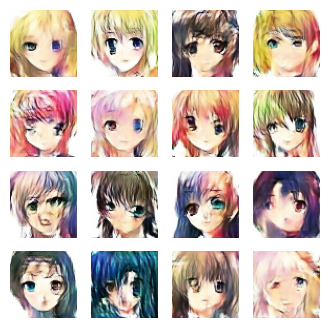

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.6232 - g_loss: 97.3679
Epoch 38/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.5113 - g_loss: 90.1639

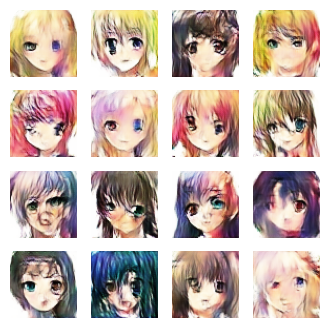

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.5109 - g_loss: 90.1168
Epoch 39/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.7341 - g_loss: 88.4151

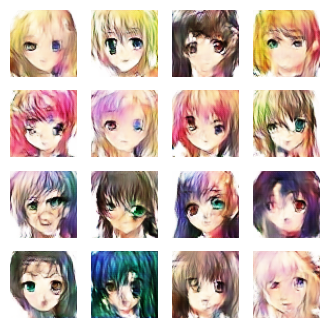

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.7332 - g_loss: 88.3440
Epoch 40/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -2.9380 - g_loss: -36.4963

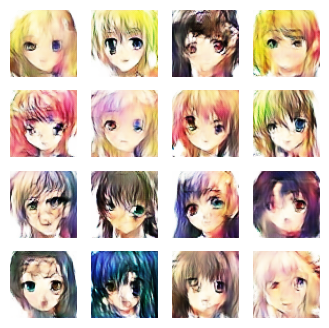

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.9366 - g_loss: -36.6849
Epoch 41/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -1.8575 - g_loss: -85.0703

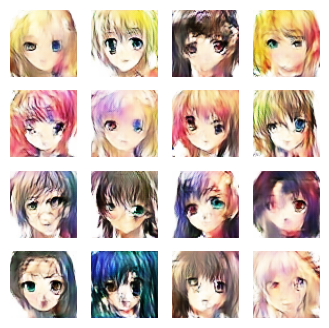

249/249 ━━━━━━━━━━━━━━━━━━━━ 118s 472ms/step - d_loss: -1.8583 - g_loss: -84.7267
Epoch 42/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -1.8213 - g_loss: 98.3269

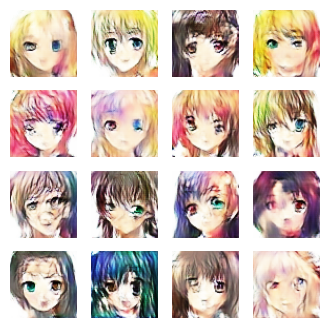

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -1.8219 - g_loss: 98.2440
Epoch 43/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.1684 - g_loss: -96.3537

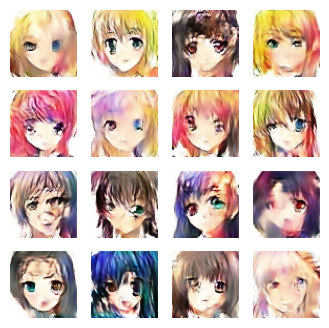

249/249 ━━━━━━━━━━━━━━━━━━━━ 142s 470ms/step - d_loss: -2.1683 - g_loss: -96.2678
Epoch 44/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -2.4055 - g_loss: 72.9494

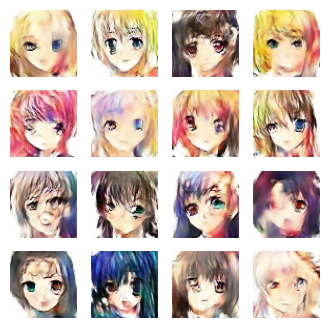

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.4046 - g_loss: 73.1711
Epoch 45/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.0046 - g_loss: 82.3683

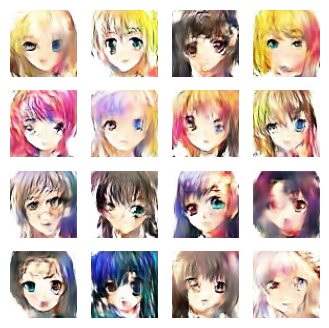

249/249 ━━━━━━━━━━━━━━━━━━━━ 142s 470ms/step - d_loss: -2.0051 - g_loss: 82.1453
Epoch 46/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -1.8882 - g_loss: 164.9293

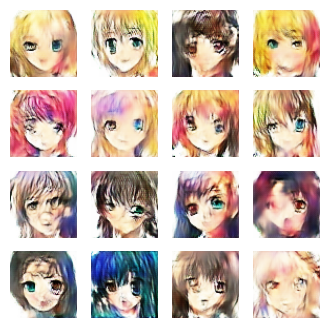

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -1.8878 - g_loss: 164.9177
Epoch 47/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - d_loss: -1.9548 - g_loss: 94.9323

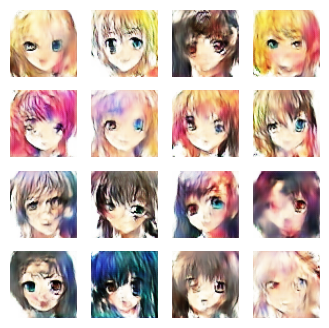

249/249 ━━━━━━━━━━━━━━━━━━━━ 118s 472ms/step - d_loss: -1.9555 - g_loss: 95.1278
Epoch 48/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -1.9709 - g_loss: 96.5835

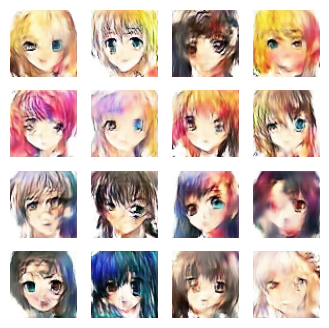

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -1.9716 - g_loss: 96.9088
Epoch 49/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -2.3089 - g_loss: 290.9253

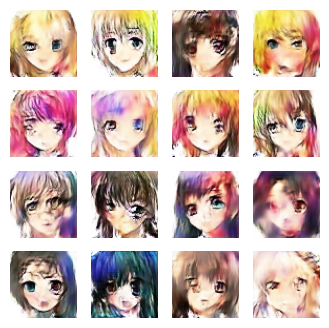

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -2.3095 - g_loss: 290.9639
Epoch 50/50
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - d_loss: -1.9302 - g_loss: 319.2973

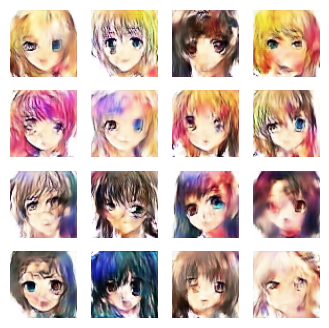

249/249 ━━━━━━━━━━━━━━━━━━━━ 117s 470ms/step - d_loss: -1.9304 - g_loss: 319.3583


In [64]:
NUM_EPOCHS = 50 # number of epochs
wgan_gp.fit(train_img, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])